# Clustering-Mean-Shift 

- NO es necesario definirle la cantidad de grupos/clusters
- NO es escalable, computacionalmente es muy pesado. Cada dato tienen un proceso iterativo en donde en cada iteración considera los vecinos a menos de un radio de distancia.
- Hipeparámetros: radio/bandwith (de cobertura para cálculo de media). (Ejercicio: Probar con varios)

## 1.-Inicialización-del-entorno

In [3]:
import numpy as np
import pandas as pd
pd.set_option('display.max_columns',100)
pd.set_option('display.max_rows',1000)
# import itertools
import warnings
warnings.filterwarnings("ignore")
import io
# from plotly.offline import init_notebook_mode, plot,iplot
# import plotly.graph_objs as go
# init_notebook_mode(connected=True)
import matplotlib.pyplot as plt
import plotly.tools as tls#visualization
import plotly.figure_factory as ff#visualization
import plotly.graph_objs as go
import seaborn as sns
from sklearn.cluster import MeanShift
from sklearn import decomposition

In [4]:
# Las versiones deben ser:
'''
Numpy = 1.21.6
Pandas = 1.3.5
Seaborn = 0.12.0
'''
print(f'Numpy = {np.__version__}')
print(f'Pandas = {pd.__version__}')
print(f'Seaborn = {sns.__version__}')

Numpy = 1.21.6
Pandas = 1.3.5
Seaborn = 0.12.0


## 2.-Preparación de los datos

In [5]:
url = 'https://raw.githubusercontent.com/DiploDatos/AprendizajeNOSupervisado/master/2021/data.csv'
df = pd.read_csv(url)
df.shape

(18207, 89)

In [6]:
n=10000 # nos vamos a quedar solo con un grupo de jugadores
df_n=df.loc[:n] #los primeros n

# Nos quedamos solo con los mejores jugadores
df_n=df_n[(df_n['Overall']>70)] 


# elegimos solo algunas habilidades
skills_ratings = ['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing',
                  'Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing',
                  'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions',
                  'Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots',
                  'Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties', 
                  'Composure', 'Marking', 'StandingTackle', 'SlidingTackle',
                  'GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes']

print(len(skills_ratings), 'variables numéricas: skills/habilidades')

df_skills=df_n[skills_ratings]

34 variables numéricas: skills/habilidades


In [7]:
df_skills

,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes
0,84.0,95.0,70.0,90.0,86.0,97.0,93.0,94.0,87.0,96.0,91.0,86.0,91.0,95.0,95.0,85.0,68.0,72.0,59.0,94.0,48.0,22.0,94.0,94.0,75.0,96.0,33.0,28.0,26.0,6.0,11.0,15.0,14.0,8.0
1,84.0,94.0,89.0,81.0,87.0,88.0,81.0,76.0,77.0,94.0,89.0,91.0,87.0,96.0,70.0,95.0,95.0,88.0,79.0,93.0,63.0,29.0,95.0,82.0,85.0,95.0,28.0,31.0,23.0,7.0,11.0,15.0,14.0,11.0
2,79.0,87.0,62.0,84.0,84.0,96.0,88.0,87.0,78.0,95.0,94.0,90.0,96.0,94.0,84.0,80.0,61.0,81.0,49.0,82.0,56.0,36.0,89.0,87.0,81.0,94.0,27.0,24.0,33.0,9.0,9.0,15.0,15.0,11.0
3,17.0,13.0,21.0,50.0,13.0,18.0,21.0,19.0,51.0,42.0,57.0,58.0,60.0,90.0,43.0,31.0,67.0,43.0,64.0,12.0,38.0,30.0,12.0,68.0,40.0,68.0,15.0,21.0,13.0,90.0,85.0,87.0,88.0,94.0
4,93.0,82.0,55.0,92.0,82.0,86.0,85.0,83.0,91.0,91.0,78.0,76.0,79.0,91.0,77.0,91.0,63.0,90.0,75.0,91.0,76.0,61.0,87.0,94.0,79.0,88.0,68.0,58.0,51.0,15.0,13.0,5.0,10.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4744,64.0,62.0,54.0,72.0,56.0,72.0,68.0,64.0,69.0,70.0,66.0,59.0,68.0,71.0,66.0,66.0,31.0,67.0,73.0,64.0,52.0,51.0,73.0,72.0,66.0,62.0,31.0,54.0,41.0,4.0,4.0,4.0,4.0,4.0
4745,69.0,57.0,59.0,73.0,57.0,71.0,69.0,59.0,69.0,73.0,78.0,79.0,74.0,69.0,76.0,63.0,78.0,84.0,76.0,67.0,71.0,59.0,69.0,69.0,59.0,69.0,63.0,59.0,55.0,9.0,9.0,8.0,6.0,7.0
4746,48.0,73.0,67.0,58.0,56.0,73.0,36.0,33.0,40.0,71.0,93.0,92.0,88.0,64.0,85.0,63.0,70.0,76.0,65.0,53.0,52.0,28.0,74.0,62.0,66.0,67.0,50.0,28.0,22.0,15.0,10.0,13.0,12.0,12.0
4747,50.0,57.0,71.0,72.0,70.0,70.0,54.0,46.0,69.0,71.0,65.0,64.0,58.0,66.0,66.0,84.0,61.0,87.0,83.0,73.0,83.0,69.0,68.0,58.0,69.0,64.0,58.0,69.0,67.0,11.0,9.0,13.0,12.0,11.0


In [8]:
# 1. Instanciamos la clase MeanShift
ms = MeanShift(bandwidth=2,
               bin_seeding=True)

# 2. Entrenamos la variable ms usando TODAS las observaciones que tenemos
ms.fit(df_skills) 

MeanShift(bandwidth=2, bin_seeding=True)

In [10]:
clusters2 = ms.labels_
clusters2

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

In [12]:
clusters_centers = ms.cluster_centers_
clusters_centers

array([[74., 52., 56., 78., 66., 78., 72., 64., 76., 78., 78., 75., 82.,
        74., 85., 82., 78., 88., 76., 70., 74., 62., 62., 74., 64., 74.,
        82., 72., 72., 14., 12.,  7.,  7., 12.],
       [30., 32., 70., 58., 40., 50., 46., 34., 62., 58., 34., 50., 40.,
        68., 38., 62., 64., 55., 78., 36., 74., 76., 28., 44., 46., 69.,
        78., 78., 72.,  7.,  6., 10., 12.,  9.],
       [12., 12., 12., 34.,  8., 28., 12., 14., 24., 28., 46., 54., 64.,
        74., 38., 24., 72., 34., 72., 18., 30., 26., 14., 50., 24., 68.,
        20., 14., 16., 88., 78., 72., 78., 88.]])

In [13]:
np.unique(clusters2)

array([0, 1, 2], dtype=int64)

In [14]:
labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 3


Notar que a partir de la decisión de definir el radio (band width = 2) el algorito encontro 3 clusters

In [21]:
bool_crack=df_n["Overall"] > 85
bool_no_crack=df_n["Overall"]<86

#Eligo dos números entre 0 y  de n_skills-1
skill_1=skills_ratings[5]
skill_2=skills_ratings[14]

data=[]
MeanShift_clusters = go.Scatter(x=df_skills[skill_1], y=df_skills[skill_2],
                           mode='markers',
                        text=df_n.loc[:,'Name'],
                           marker=dict(
                                size=5,
                                color = clusters2.astype(np.float), #set color equal to a variable
                                colorscale='Portland',
                                showscale=False)
                           )

crack =go.Scatter(x=df_skills.loc[bool_crack,skill_1], y=df_skills.loc[bool_crack,skill_2],name='Top players',
                      text=df_n.loc[bool_crack,'Name'],
                      textfont=dict(family='sans serif',size=10,color='black'),
                      opacity=0.9,mode='text')

data=[MeanShift_clusters,crack]

layout = go.Layout(title="Mean Shift",titlefont=dict(size=20),
                xaxis=dict(title=skill_1),
                yaxis=dict(title=skill_2),
                autosize=False, width=1000,height=650)

fig = go.Figure(data=data, layout=layout)

fig.show()

In [22]:
# hacemos una copia de la df_n para trabajar sobre ella
df_clusters=df_n.copy()

# agregamos una columna y en ella ponemos el cluster al que asignado cada jugador
df_clusters['Mean_shift'] = ms.labels_ #clusters
df_clusters.sample(4)

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,Mean_shift
1604,1604,190223,Balenziaga,30,https://cdn.sofifa.org/players/4/19/190223.png,Spain,https://cdn.sofifa.org/flags/45.png,75,75,Athletic Club de Bilbao,https://cdn.sofifa.org/teams/2/light/448.png,€4.8M,€20K,1911,Left,1.0,4.0,3.0,High/ Medium,Normal,Yes,LB,24.0,"Jul 1, 2013",NaN,2019,5'10,168lbs,61+2,61+2,61+2,65+2,63+2,63+2,63+2,65+2,64+2,64+2,64+2,68+2,68+2,68+2,68+2,68+2,74+2,72+2,72+2,72+2,74+2,74+2,72+2,72+2,72+2,74+2,78.0,41.0,71.0,70.0,50.0,67.0,76.0,33.0,69.0,72.0,73.0,75.0,68.0,71.0,69.0,61.0,78.0,85.0,71.0,54.0,78.0,74.0,54.0,62.0,44.0,69.0,68.0,76.0,74.0,15.0,10.0,7.0,6.0,11.0,€10.1M,0
2977,2977,192665,A. Luthe,31,https://cdn.sofifa.org/players/4/19/192665.png,Germany,https://cdn.sofifa.org/flags/21.png,73,73,FC Augsburg,https://cdn.sofifa.org/teams/2/light/100409.png,€2.4M,€15K,1105,Right,1.0,3.0,1.0,Medium/ Medium,Normal,No,GK,1.0,"Jul 1, 2016",NaN,2020,6'5,187lbs,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.0,12.0,15.0,24.0,12.0,12.0,15.0,12.0,19.0,14.0,38.0,50.0,39.0,63.0,34.0,23.0,61.0,36.0,74.0,16.0,22.0,21.0,12.0,49.0,21.0,23.0,16.0,14.0,12.0,77.0,68.0,61.0,73.0,76.0,€4.1M,2
1575,1575,212225,E. Roco,25,https://cdn.sofifa.org/players/4/19/212225.png,Chile,https://cdn.sofifa.org/flags/55.png,75,78,Beşiktaş JK,https://cdn.sofifa.org/teams/2/light/327.png,€7M,€36K,1612,Right,2.0,3.0,2.0,Medium/ High,Normal,No,CB,3.0,"Jul 27, 2018",NaN,2021,6'4,174lbs,54+2,54+2,54+2,51+2,53+2,53+2,53+2,51+2,55+2,55+2,55+2,54+2,61+2,61+2,61+2,54+2,63+2,69+2,69+2,69+2,63+2,65+2,73+2,73+2,73+2,65+2,40.0,43.0,79.0,70.0,27.0,55.0,27.0,31.0,60.0,62.0,37.0,43.0,57.0,73.0,43.0,45.0,80.0,72.0,84.0,39.0,66.0,72.0,42.0,49.0,34.0,67.0,77.0,75.0,69.0,13.0,9.0,13.0,13.0,13.0,€13.8M,1
2844,2844,186982,A. Büttner,29,https://cdn.sofifa.org/players/4/19/186982.png,Netherlands,https://cdn.sofifa.org/flags/34.png,73,73,Vitesse,https://cdn.sofifa.org/teams/2/light/1909.png,€3M,€12K,2066,Left,1.0,3.0,3.0,High/ Medium,Normal,Yes,LB,28.0,"Jan 16, 2017",NaN,2019,5'9,165lbs,69+2,69+2,69+2,71+2,70+2,70+2,70+2,71+2,70+2,70+2,70+2,72+2,70+2,70+2,70+2,72+2,72+2,70+2,70+2,70+2,72+2,71+2,70+2,70+2,70+2,71+2,80.0,58.0,65.0,71.0,60.0,73.0,78.0,75.0,72.0,74.0,74.0,77.0,70.0,70.0,74.0,82.0,73.0,71.0,68.0,72.0,79.0,66.0,70.0,69.0,74.0,69.0,67.0,73.0,74.0,8.0,11.0,14.0,14.0,10.0,€4.5M,0


In [24]:
df_clusters.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4749 entries, 0 to 4748
Data columns (total 90 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Unnamed: 0                4749 non-null   int64  
 1   ID                        4749 non-null   int64  
 2   Name                      4749 non-null   object 
 3   Age                       4749 non-null   int64  
 4   Photo                     4749 non-null   object 
 5   Nationality               4749 non-null   object 
 6   Flag                      4749 non-null   object 
 7   Overall                   4749 non-null   int64  
 8   Potential                 4749 non-null   int64  
 9   Club                      4682 non-null   object 
 10  Club Logo                 4749 non-null   object 
 11  Value                     4749 non-null   object 
 12  Wage                      4749 non-null   object 
 13  Special                   4749 non-null   int64  
 14  Preferre

### Features    

`Crossing`, `Finishing`, `HeadingAccuracy`, `ShortPassing`

<Figure size 432x288 with 0 Axes>

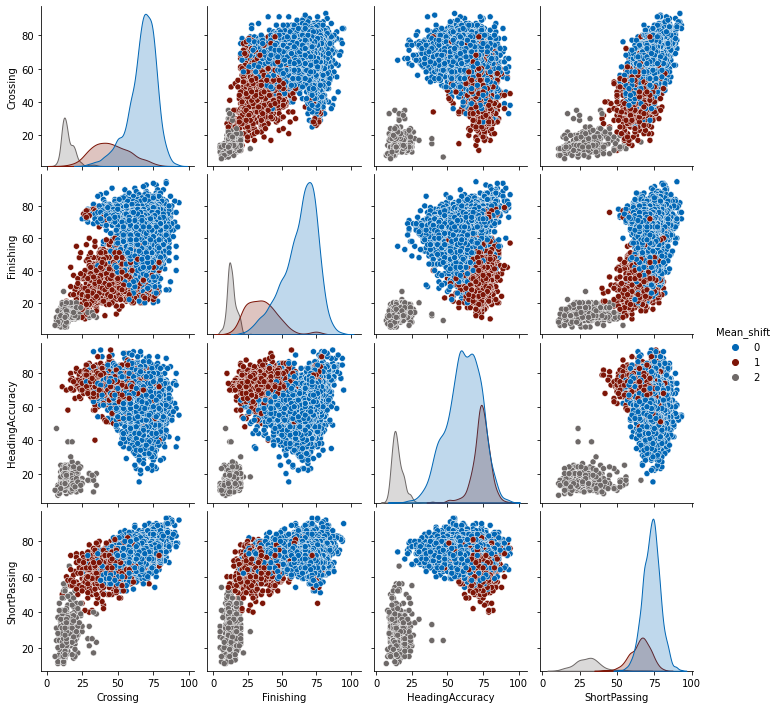

In [27]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette={0:'#0267b5', #blue
                          1:'#7d1507', #red
                          2:'#6e6968'} #black
              
             )
plt.show()

`Volleys`, `Dribbling`, `Curve`, `FKAccuracy`, `LongPassing`

<Figure size 432x288 with 0 Axes>

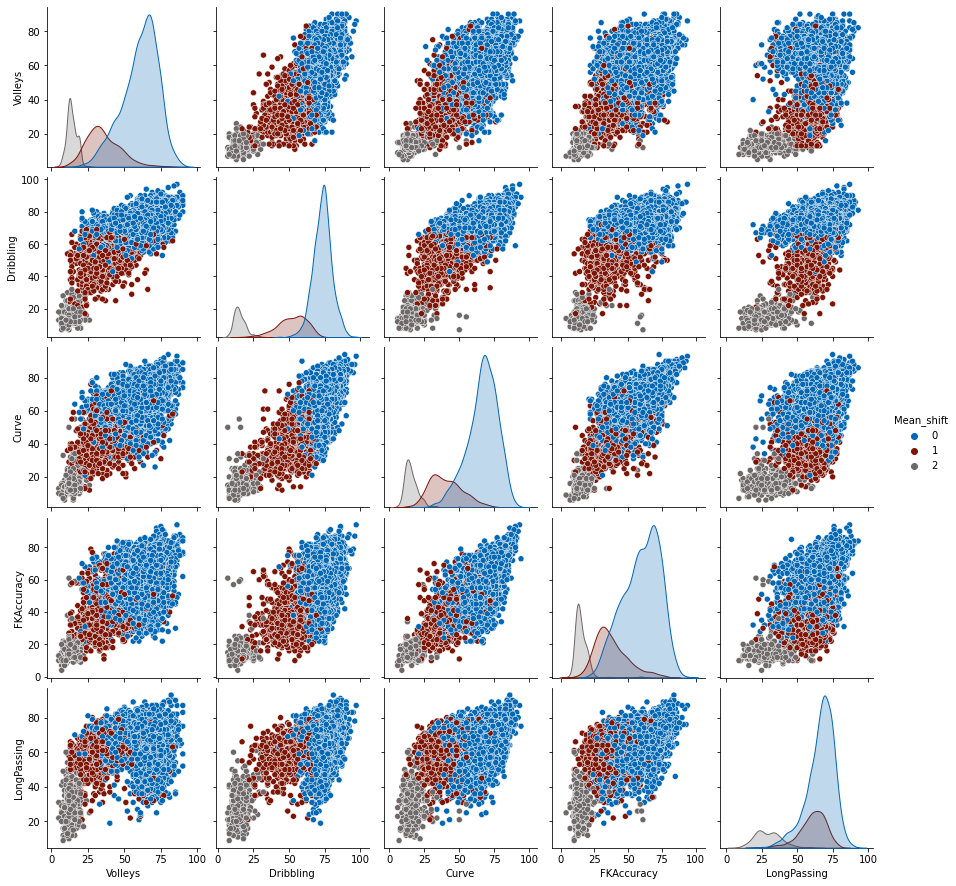

In [28]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette={0:'#0267b5', #blue
                          1:'#7d1507', #red
                          2:'#6e6968'} #black 
             )
plt.show()

`BallControl`, `Acceleration`, `SprintSpeed`, `Agility`, `Reactions`

<Figure size 432x288 with 0 Axes>

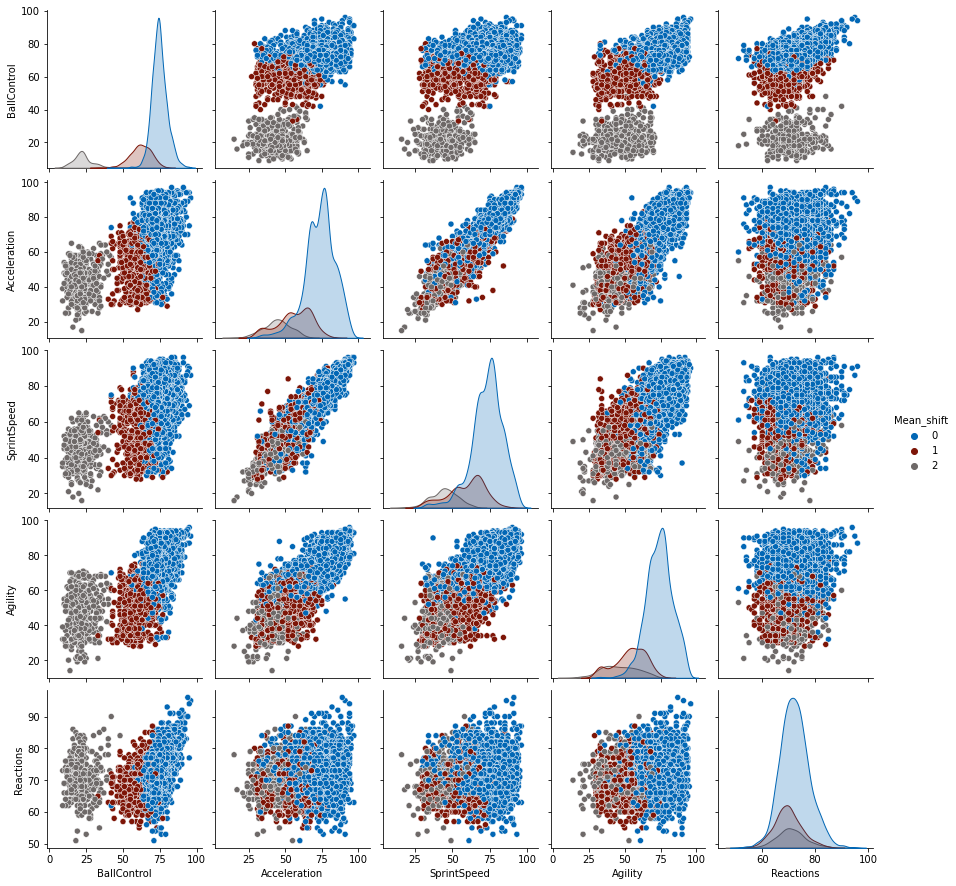

In [29]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette={0:'#0267b5', #blue
                          1:'#7d1507', #red
                          2:'#6e6968'} #black 
             )
plt.show()

`Balance`, `ShotPower`, `Jumping`, `Stamina`, `Strength`, `LongShots`

<Figure size 432x288 with 0 Axes>

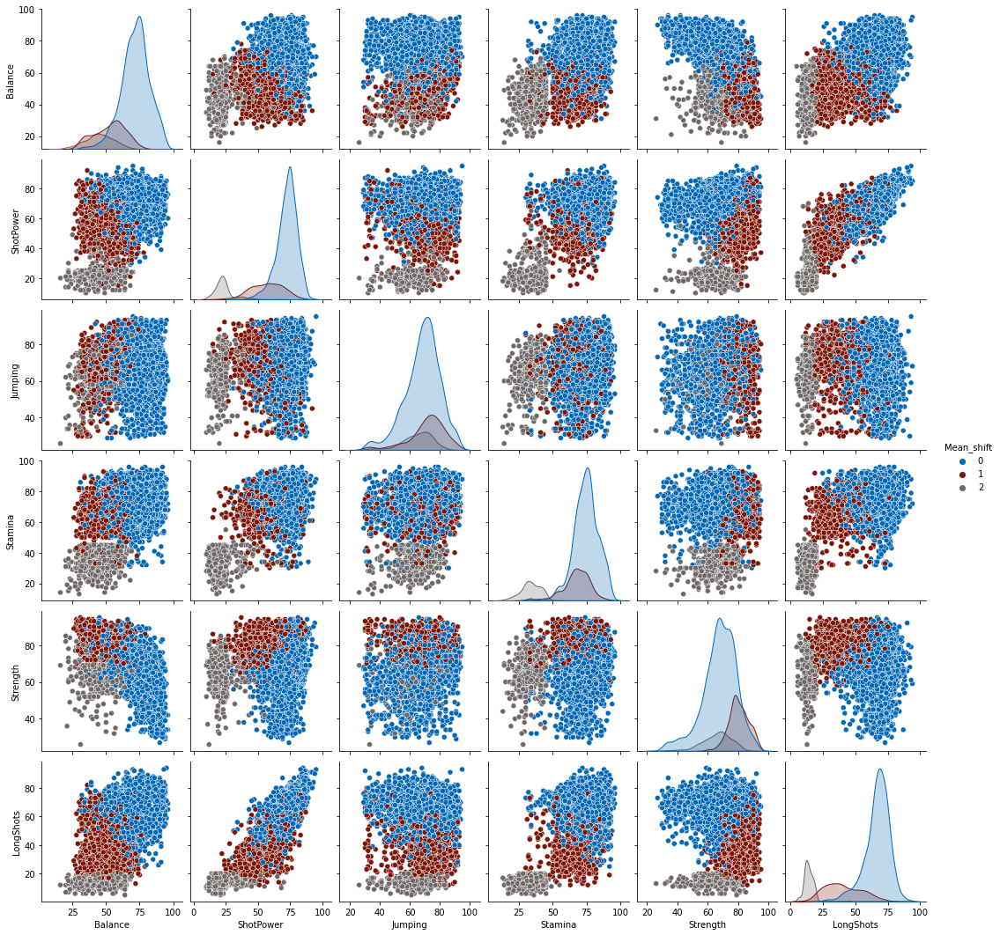

In [30]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette={0:'#0267b5', #blue
                          1:'#7d1507', #red
                          2:'#6e6968'} #black 
             )
plt.show()

`Aggression`, `Interceptions`, `Positioning`, `Vision`, `Penalties`

<Figure size 432x288 with 0 Axes>

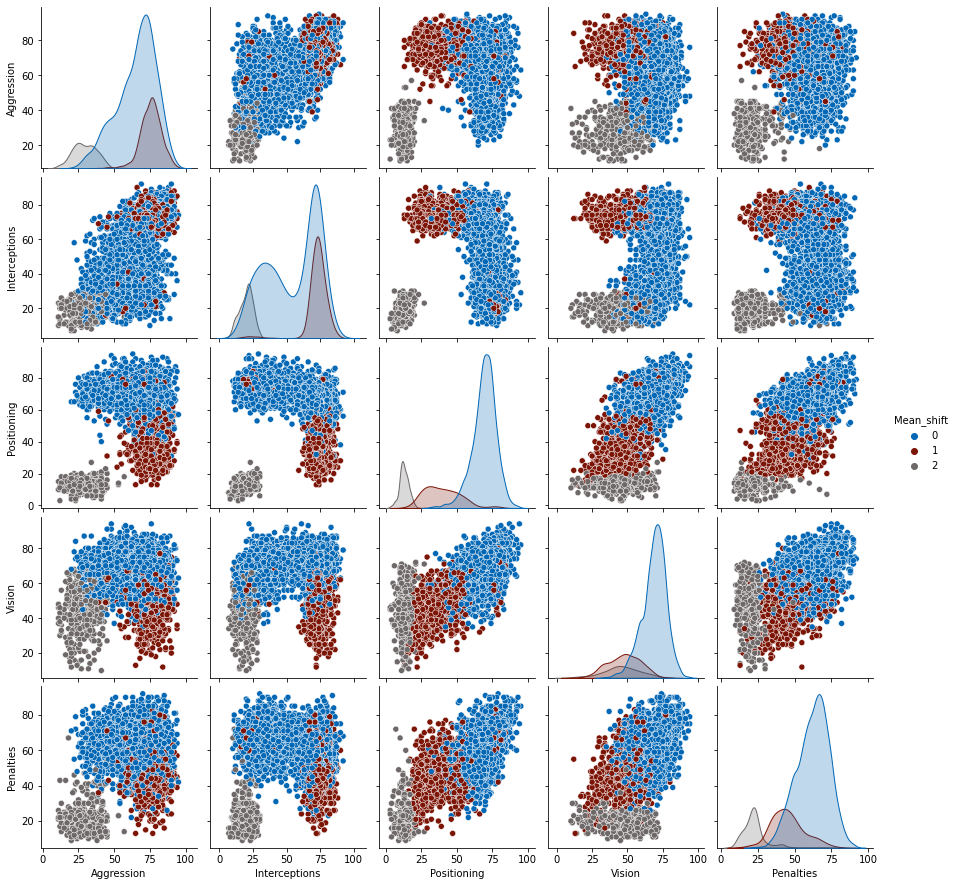

In [31]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette={0:'#0267b5', #blue
                          1:'#7d1507', #red
                          2:'#6e6968'} #black 
             )
plt.show()

`Composure`, `Marking`, `StandingTackle`, `SlidingTackle`

<Figure size 432x288 with 0 Axes>

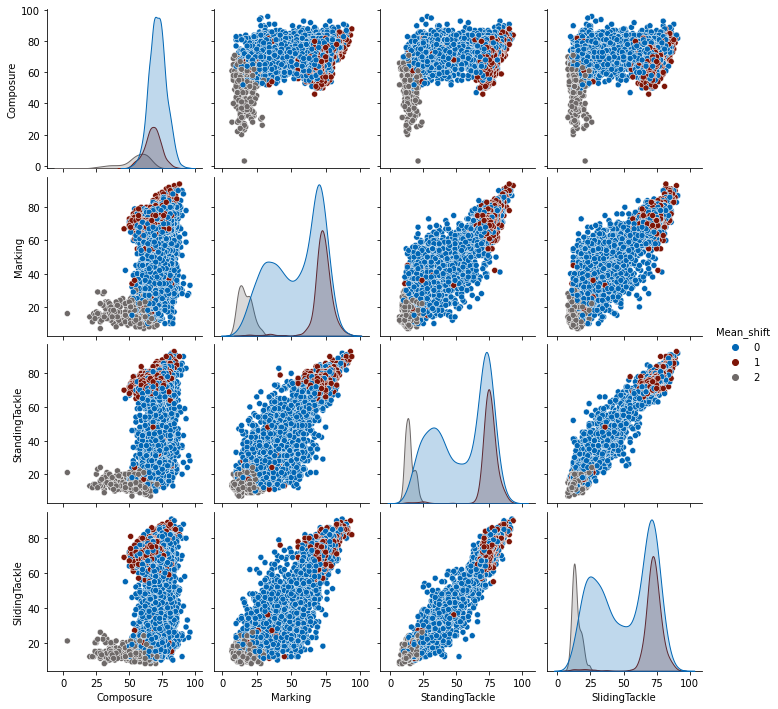

In [32]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Composure', 'Marking', 'StandingTackle', 'SlidingTackle','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette={0:'#0267b5', #blue
                          1:'#7d1507', #red
                          2:'#6e6968'} #black 
             )
plt.show()

`GKDiving`, `GKHandling`, `GKKicking`, `GKPositioning`, `GKReflexes`

<Figure size 432x288 with 0 Axes>

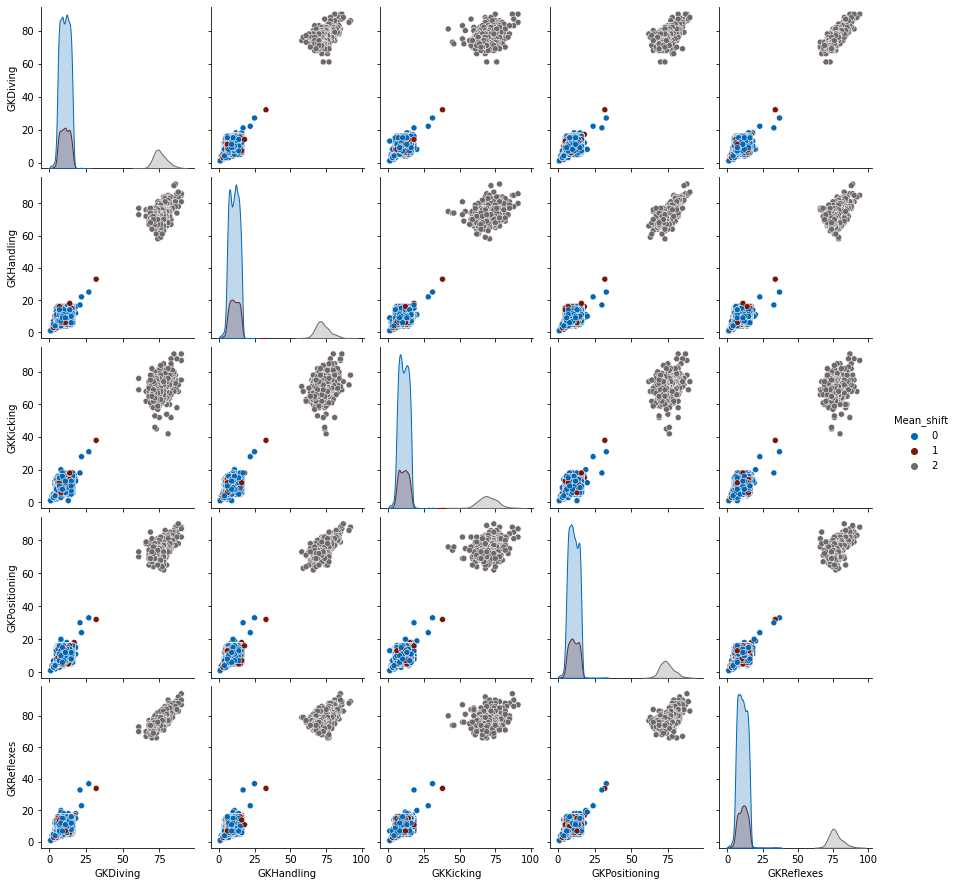

In [33]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette={0:'#0267b5', #blue
                          1:'#7d1507', #red
                          2:'#6e6968'} #black 
             )
plt.show()

## Clustering-Mean-Shift-sin-arqueros 

In [34]:
n=10000
df_n=df.loc[:n]
df_n=df_n[(df_n["Position"]!='GK')&(df_n['Overall']>70)]

skills_ratings = ['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing',
                  'Volleys','Dribbling', 'Curve', 'FKAccuracy', 'LongPassing',
                  'BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions',
                  'Balance', 'ShotPower', 'Jumping','Stamina', 'Strength', 'LongShots',
                  'Aggression', 'Interceptions', 'Positioning','Vision', 'Penalties',
                  'Composure', 'Marking', 'StandingTackle', 'SlidingTackle']

df_skills=df_n[skills_ratings]

In [52]:
# 1. Instanciamos la clase MeanShift
ms = MeanShift(bandwidth=3,
               bin_seeding=True)

# 2. Entrenamos la variable ms usando TODAS las observaciones que tenemos
ms.fit(df_skills) 


MeanShift(bandwidth=3, bin_seeding=True)

In [53]:
clusters2 = ms.labels_
clusters2

array([1, 1, 1, ..., 1, 1, 0], dtype=int64)

In [54]:
clusters_centers = ms.cluster_centers_
clusters_centers

array([[84., 79., 61., 90., 72., 78., 89., 90., 87., 84., 51., 43., 66.,
        78., 72., 78., 51., 78., 72., 82., 58., 81., 81., 86., 83., 78.,
        69., 68., 60.],
       [69., 75., 57., 75., 66., 81., 63., 42., 63., 75., 88., 78., 84.,
        75., 66., 72., 51., 83., 66., 73., 44., 57., 75., 69., 69., 75.,
        65., 33., 23.]])

In [55]:
np.unique(clusters2)

array([0, 1], dtype=int64)

In [56]:
labels_unique = np.unique(clusters2)
n_clusters_ = len(labels_unique)

print("Cantidad de clusters encontrados por Mean Shift : %d" % n_clusters_)

Cantidad de clusters encontrados por Mean Shift : 2


In [57]:
# hacemos una copia de la df_n para trabajar sobre ella
df_clusters=df_n.copy()

# agregamos una columna y en ella ponemos el cluster al que asignado cada jugador
df_clusters['Mean_shift'] = ms.labels_ #clusters
df_clusters.sample(4)

,Unnamed: 0,ID,Name,Age,Photo,Nationality,Flag,Overall,Potential,Club,Club Logo,Value,Wage,Special,Preferred Foot,International Reputation,Weak Foot,Skill Moves,Work Rate,Body Type,Real Face,Position,Jersey Number,Joined,Loaned From,Contract Valid Until,Height,Weight,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,Crossing,Finishing,HeadingAccuracy,ShortPassing,Volleys,Dribbling,Curve,FKAccuracy,LongPassing,BallControl,Acceleration,SprintSpeed,Agility,Reactions,Balance,ShotPower,Jumping,Stamina,Strength,LongShots,Aggression,Interceptions,Positioning,Vision,Penalties,Composure,Marking,StandingTackle,SlidingTackle,GKDiving,GKHandling,GKKicking,GKPositioning,GKReflexes,Release Clause,Mean_shift
839,839,200607,C. Schindler,28,https://cdn.sofifa.org/players/4/19/200607.png,Germany,https://cdn.sofifa.org/flags/21.png,78,80,Huddersfield Town,https://cdn.sofifa.org/teams/2/light/1939.png,€10M,€48K,1690,Right,1.0,3.0,2.0,Medium/ Medium,Normal,Yes,CB,26.0,"Jun 29, 2016",NaN,2020,6'2,170lbs,50+2,50+2,50+2,50+2,50+2,50+2,50+2,50+2,53+2,53+2,53+2,54+2,60+2,60+2,60+2,54+2,69+2,73+2,73+2,73+2,69+2,72+2,77+2,77+2,77+2,72+2,49.0,25.0,74.0,68.0,30.0,42.0,45.0,33.0,64.0,68.0,60.0,65.0,56.0,77.0,57.0,52.0,74.0,68.0,78.0,24.0,76.0,81.0,27.0,51.0,55.0,73.0,81.0,81.0,78.0,6.0,11.0,10.0,12.0,12.0,€19.8M,1
783,783,215330,J. Correa,23,https://cdn.sofifa.org/players/4/19/215330.png,Argentina,https://cdn.sofifa.org/flags/52.png,78,83,Lazio,https://cdn.sofifa.org/teams/2/light/46.png,€14M,€42K,1855,Right,1.0,4.0,4.0,High/ Medium,Lean,Yes,LM,11.0,"Aug 1, 2018",NaN,2023,6'2,170lbs,72+2,72+2,72+2,77+2,76+2,76+2,76+2,77+2,77+2,77+2,77+2,77+2,72+2,72+2,72+2,77+2,60+2,58+2,58+2,58+2,60+2,55+2,47+2,47+2,47+2,55+2,74.0,74.0,43.0,78.0,75.0,85.0,79.0,63.0,69.0,83.0,76.0,79.0,82.0,70.0,61.0,76.0,32.0,75.0,74.0,71.0,48.0,36.0,74.0,75.0,57.0,73.0,39.0,37.0,26.0,11.0,10.0,7.0,8.0,8.0,€24.9M,1
3098,3098,224719,A. Tashaev,24,https://cdn.sofifa.org/players/4/19/224719.png,Russia,https://cdn.sofifa.org/flags/40.png,73,77,Spartak Moscow,https://cdn.sofifa.org/teams/2/light/100767.png,€5M,€1K,1807,Right,1.0,4.0,3.0,High/ High,Normal,No,LM,88.0,"Jul 24, 2018",NaN,2022,5'10,165lbs,65+2,65+2,65+2,70+2,69+2,69+2,69+2,70+2,70+2,70+2,70+2,72+2,66+2,66+2,66+2,72+2,59+2,55+2,55+2,55+2,59+2,55+2,47+2,47+2,47+2,55+2,73.0,65.0,49.0,72.0,65.0,75.0,72.0,65.0,70.0,74.0,79.0,73.0,65.0,62.0,72.0,58.0,65.0,77.0,59.0,54.0,51.0,28.0,67.0,75.0,60.0,62.0,50.0,34.0,41.0,15.0,11.0,10.0,14.0,7.0,€10.9M,1
1937,1937,211124,P. Hurtado,27,https://cdn.sofifa.org/players/4/19/211124.png,Peru,https://cdn.sofifa.org/flags/59.png,75,75,Atiker Konyaspor,https://cdn.sofifa.org/teams/2/light/101033.png,€7M,€18K,1919,Right,1.0,4.0,4.0,Medium/ Low,Normal,No,CAM,16.0,"Aug 6, 2018",NaN,2021,5'9,159lbs,73+2,73+2,73+2,74+2,74+2,74+2,74+2,74+2,74+2,74+2,74+2,73+2,69+2,69+2,69+2,73+2,59+2,57+2,57+2,57+2,59+2,57+2,51+2,51+2,51+2,57+2,70.0,72.0,72.0,74.0,70.0,75.0,68.0,72.0,71.0,76.0,80.0,83.0,75.0,70.0,73.0,76.0,80.0,65.0,59.0,71.0,42.0,45.0,72.0,74.0,69.0,72.0,48.0,34.0,28.0,7.0,12.0,16.0,11.0,9.0,€14M,1


### Features    

`Crossing`, `Finishing`, `HeadingAccuracy`, `ShortPassing`

<Figure size 432x288 with 0 Axes>

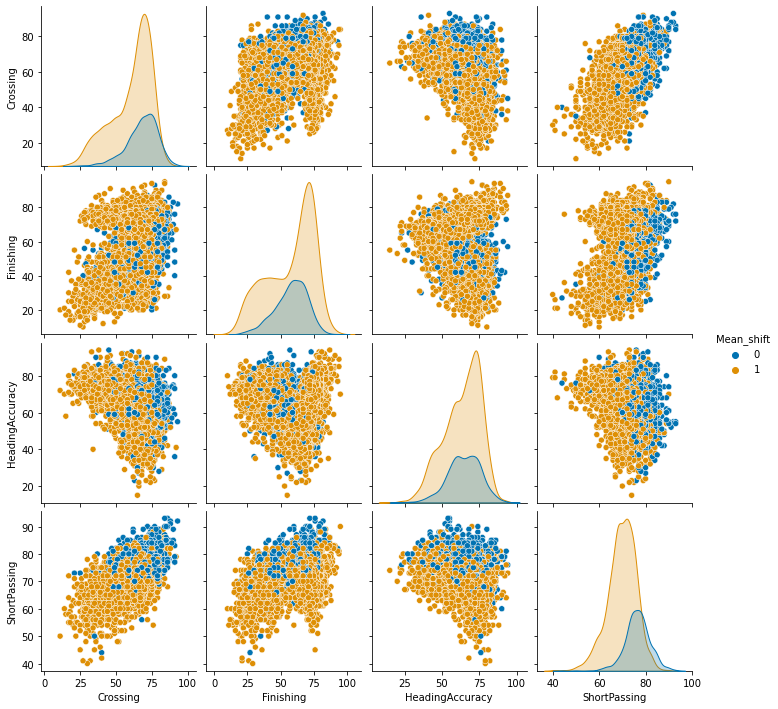

In [59]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Crossing', 'Finishing', 'HeadingAccuracy', 'ShortPassing','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette='colorblind'
             )
plt.show()

`Volleys`, `Dribbling`, `Curve`, `FKAccuracy`, `LongPassing`

<Figure size 432x288 with 0 Axes>

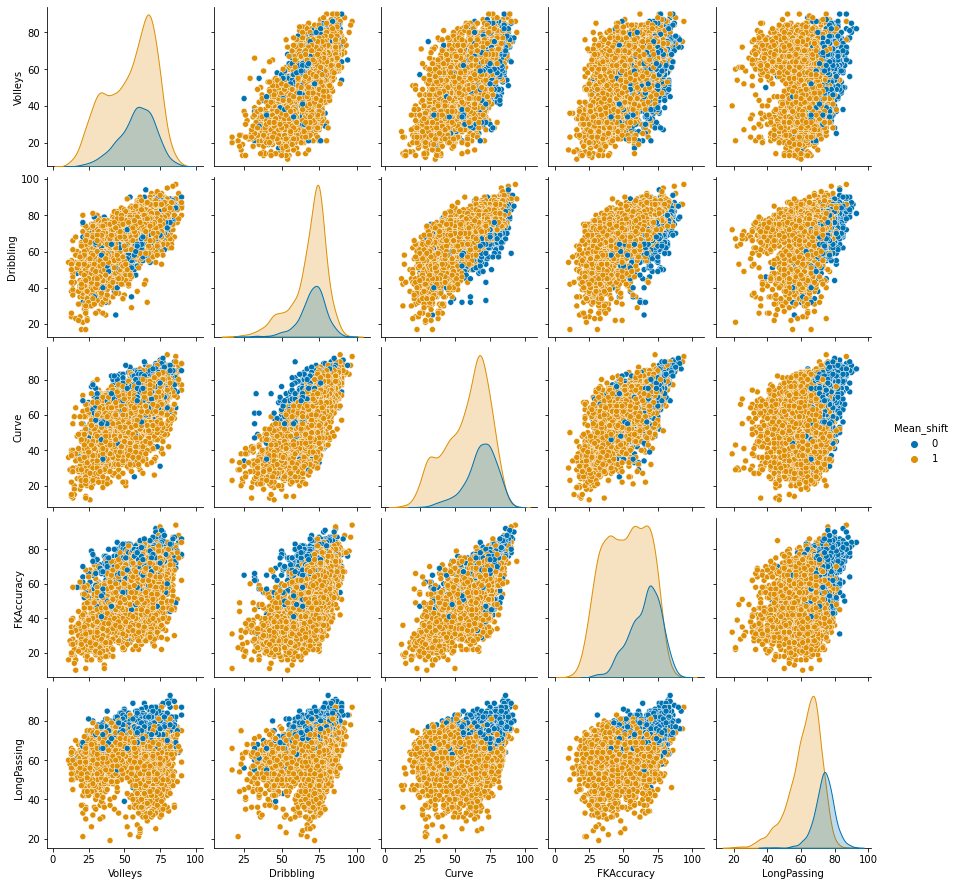

In [60]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Volleys', 'Dribbling', 'Curve', 'FKAccuracy', 'LongPassing','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette='colorblind'
             )
plt.show()

`BallControl`, `Acceleration`, `SprintSpeed`, `Agility`, `Reactions`

<Figure size 432x288 with 0 Axes>

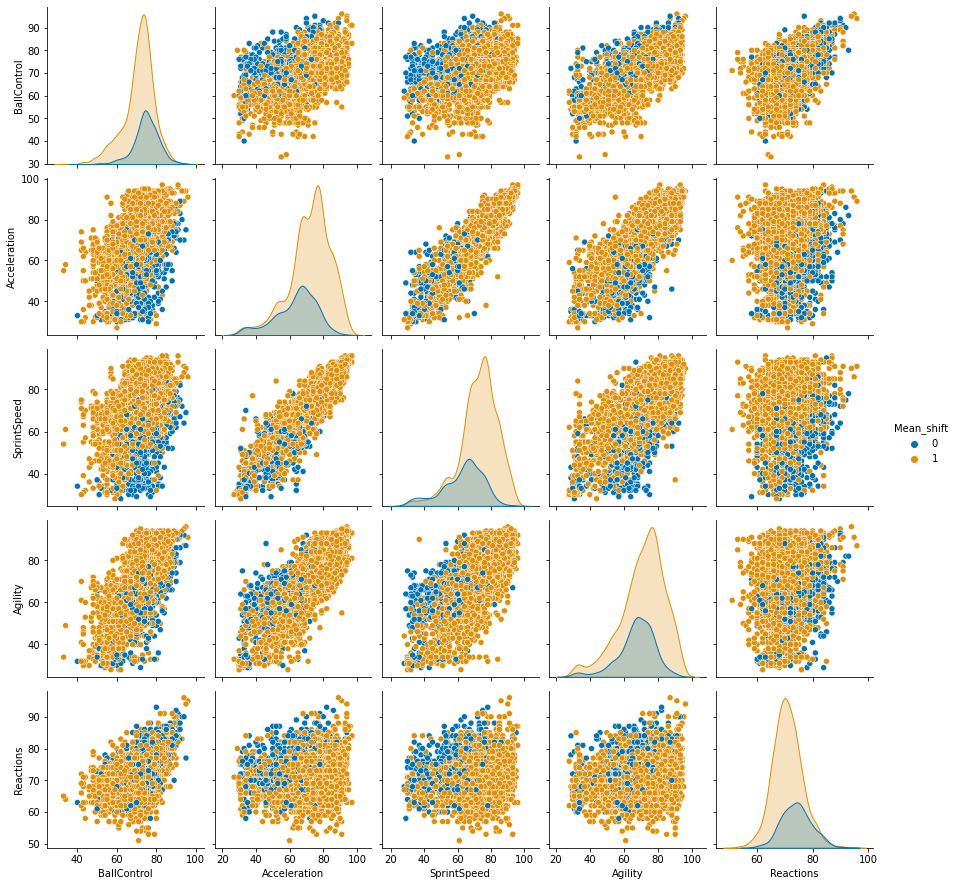

In [61]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['BallControl', 'Acceleration', 'SprintSpeed', 'Agility', 'Reactions','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette='colorblind'
             )
plt.show()

`Balance`, `ShotPower`, `Jumping`, `Stamina`, `Strength`, `LongShots`

<Figure size 432x288 with 0 Axes>

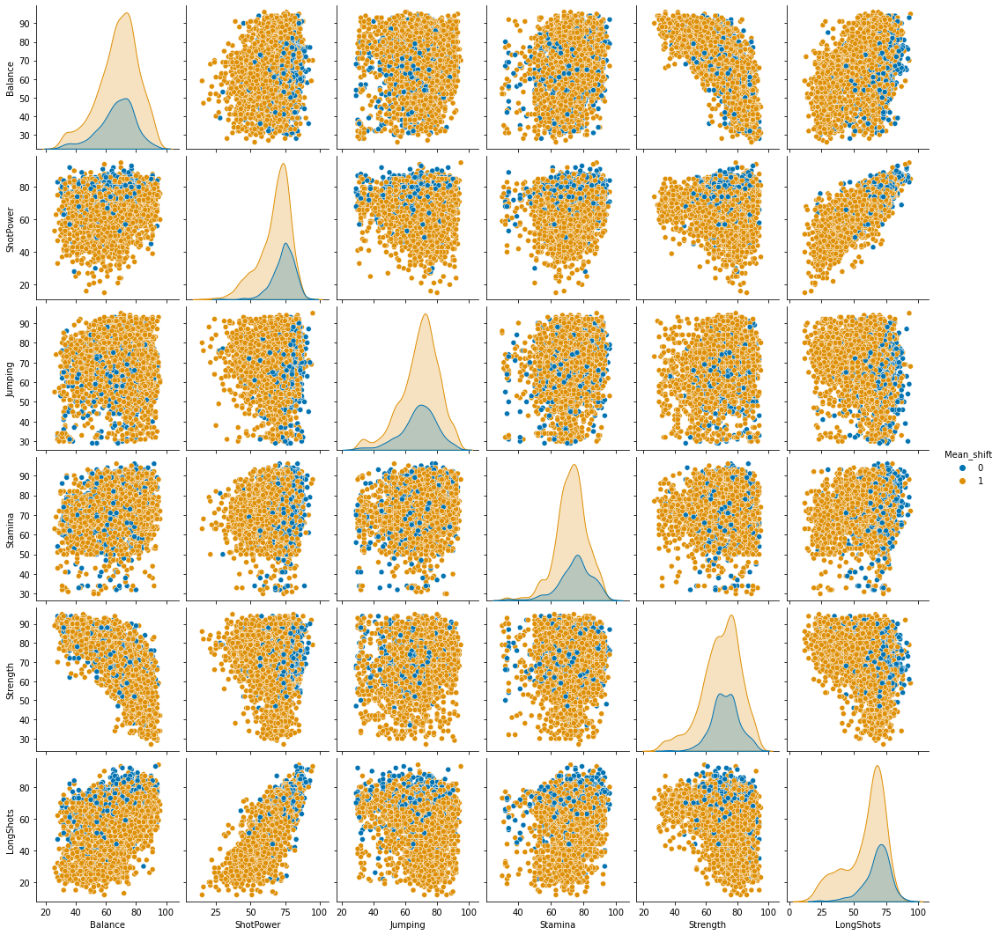

In [62]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Balance', 'ShotPower', 'Jumping', 'Stamina', 'Strength', 'LongShots','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette='colorblind'
             )
plt.show()

`Aggression`, `Interceptions`, `Positioning`, `Vision`, `Penalties`

<Figure size 432x288 with 0 Axes>

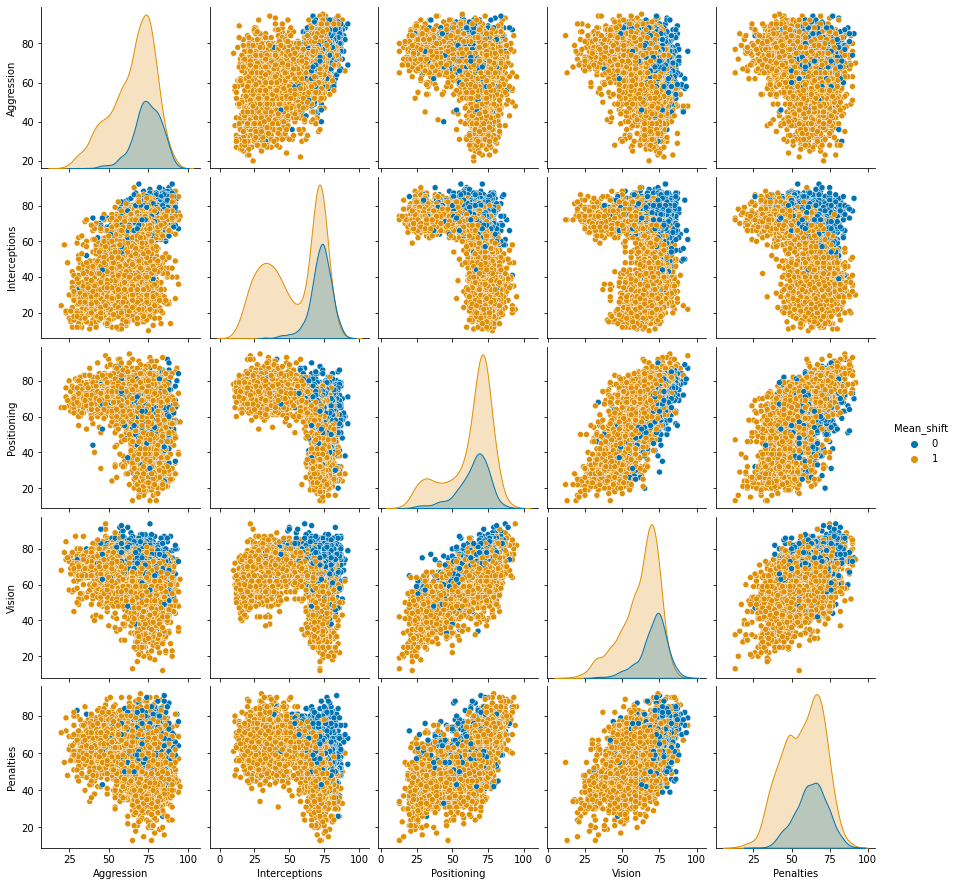

In [63]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Aggression', 'Interceptions', 'Positioning', 'Vision', 'Penalties','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette='colorblind'
             )
plt.show()

`Composure`, `Marking`, `StandingTackle`, `SlidingTackle`

<Figure size 432x288 with 0 Axes>

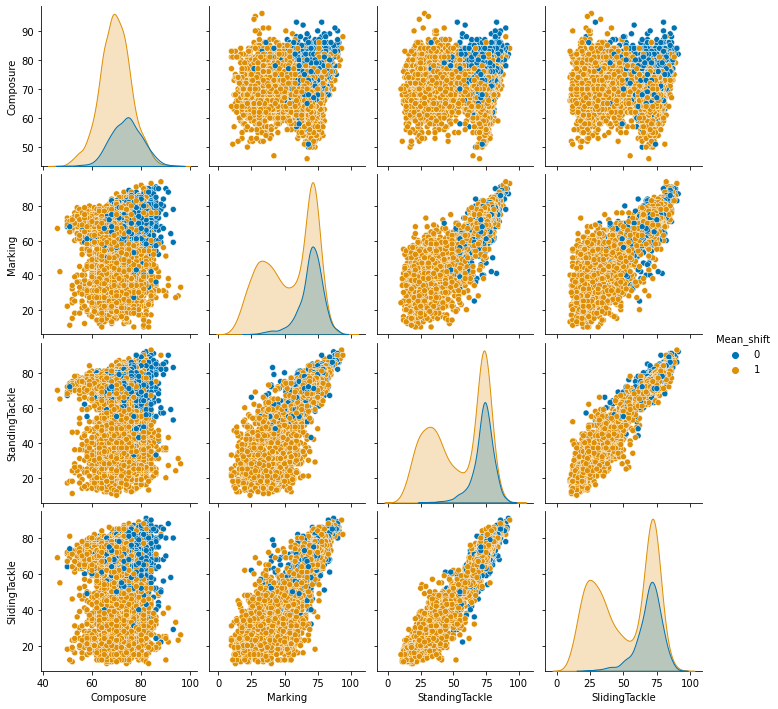

In [64]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['Composure', 'Marking', 'StandingTackle', 'SlidingTackle','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette='colorblind'
             )
plt.show()

`GKDiving`, `GKHandling`, `GKKicking`, `GKPositioning`, `GKReflexes`

<Figure size 432x288 with 0 Axes>

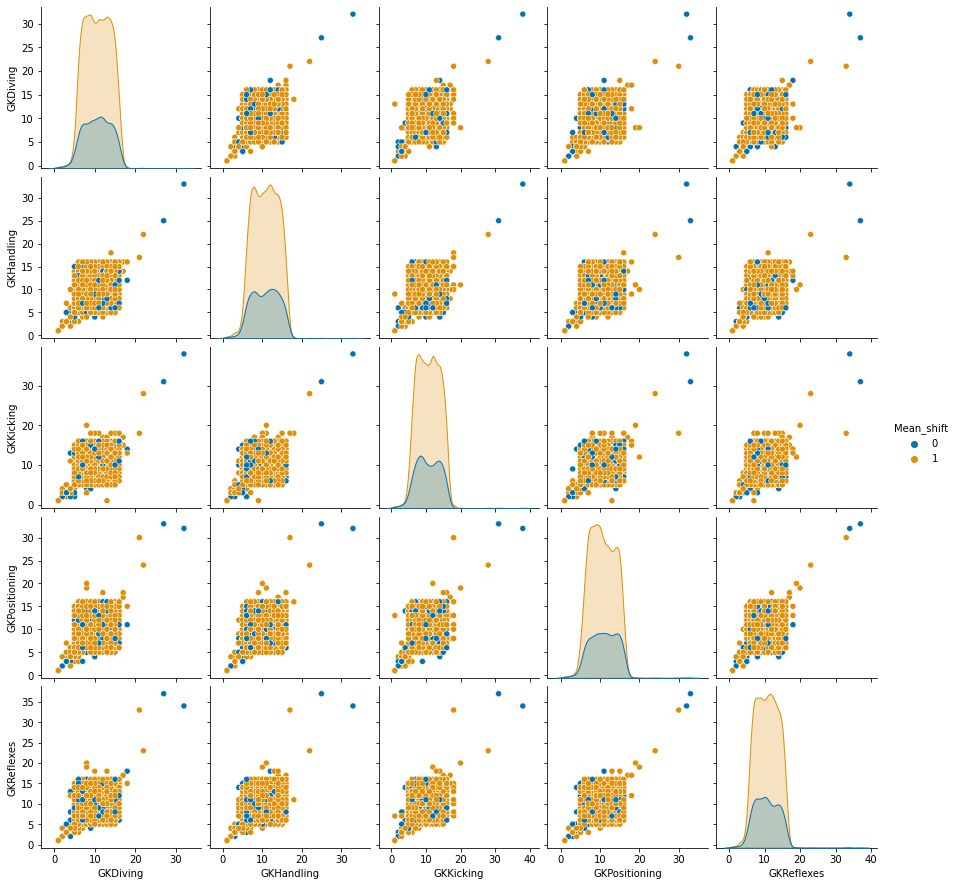

In [65]:
# Si queremos inspeccionar relaciones entre más de dos features podemos usar la clase pairplot de Seaborn
fig = plt.figure()
data = df_clusters[['GKDiving', 'GKHandling', 'GKKicking', 'GKPositioning', 'GKReflexes','Mean_shift']]
sns.pairplot(data,
             hue = 'Mean_shift',
             palette='colorblind'
             )
plt.show()